# LSTM Recurrent Neural Network For Multilabel Audio Classification

Our code here proceeds with performing classification of different audio samples to classify testing audio samples into their respective classes.

Our Model is that of an LSTM model of RNN because audio is a time dependent structure that requires memorizing what happens in the past.

We used the URBANSOUND8K dataset which contains around 8000 audio samples for training.

The first block of code imports all the necessary libraries that are required.
We use the librosa library to perform different preprocessing that are required on audio samples. 

In [11]:
import glob
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
%matplotlib inline
plt.style.use('ggplot')

# The below functions that are defined are used for simple exploratory data analysis

We load our sample audio files to plot different graphs. Our sample audio files consist of 10 audio files that need to be classified. So before we do that we load the sound files from the file directory and then get their wave plots, spectogram plots and log powered spectogram plots

In [12]:
def load_sound_files(parent_dir, file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(parent_dir + fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

In [13]:
sound_file_paths = ["aircon.wav", "carhorn.wav", "play.wav", "dogbark.wav", "drill.wav",
                   "engine.wav","gunshots.wav","jackhammer.wav","siren.wav","music.wav"]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

parent_dir = 'D://MachineLearningProjects//Multilabel_Audio_Classification//Samples//'

raw_sounds = load_sound_files(parent_dir, sound_file_paths)

The below functions are called to display the plot

In [10]:
plot_waves(sound_names, raw_sounds)

In [15]:
plot_log_power_specgram(sound_names, raw_sounds)

D:\Anaconda\lib\site-packages\librosa\display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


# Feature Extraction for RNNs

The idea is to calculate log-scaled mel-spectrograms and their corresponding deltas from a sound clip. Because we need fixed size input, we split each sound clip into 41 overlapping frames, one for each of the 20 mel-bands, giving an array of 20 rows and 41 columns. The mel-spectrogram for each band/segment and its time-series deltas will become two channels, which becomes our input to feed into the RNN. Other features could be calculated in the same way and supplied as a separate input channel, but we'll stick with just the mel-spectragram data for this example.


We executed this kernel/ipython notebook in another ipython notebook by increasing the number of mel- bands that is usually used in Convolutional Neural Networks.

In [2]:
def windows(data, window_size):
    start = 0
    while start < len(data):
        yield start, start + window_size
        start += (window_size // 2)

def extract_features(parent_dir,sub_dirs,file_ext="*.wav",bands = 20, frames = 41):
    window_size = 512 * (frames - 1)
    mfccs = []
    labels = []
    for l, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            sound_clip,s = librosa.load(fn)
            label = fn.split('fold')[1].split('-')[1]
            for (start,end) in windows(sound_clip,window_size):
                if(len(sound_clip[start:end]) == window_size):
                    signal = sound_clip[start:end]
                    mfcc = librosa.feature.mfcc(y=signal, sr=s, n_mfcc = bands).T.flatten()[:, np.newaxis].T
                    mfccs.append(mfcc)
                    labels.append(label)         
    features = np.asarray(mfccs).reshape(len(mfccs),bands,frames)
    return np.array(features), np.array(labels,dtype = np.int)

def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

# Saving the extracted Features and storing them in numpy arrays

The code in the cell below can be run (once) and its already been executed once to convert the raw audio files into features, which are stored as numpy arrays. As this process is quite time consuming, we'd prefer to just do it once, and then load the numpy data when we want to do some training. We save it in the save-dir and convert them into 10 folds to use as training and testing sets.



Labels are saved as one_hot vectors, features are the extracted features or MFCC's

In [3]:
# use this to process the audio files into numpy arrays
def save_folds(data_dir):
    for k in range(1,11):
        fold_name = 'fold' + str(k)
        print("\nSaving " + fold_name)
        features, labels = extract_features(parent_dir, [fold_name])
        labels = one_hot_encode(labels)
        
        print("Features of", fold_name , " = ", features.shape)
        print("Labels of", fold_name , " = ", labels.shape)
        
        feature_file = os.path.join(data_dir, fold_name + '_x.npy')
        labels_file = os.path.join(data_dir, fold_name + '_y.npy')
        np.save(feature_file, features)
        print("Saved " + feature_file)
        np.save(labels_file, labels)
        print("Saved " + labels_file)

def assure_path_exists(path):
    mydir = os.path.join(os.getcwd(), path)
    if not os.path.exists(mydir):
        os.makedirs(mydir)
        
# recreate and save the feature vectors
parent_dir = "D://MachineLearningProjects//Multilabel_Audio_Classification//UrbanSound8K//audio" # UrbanSound8K data set"       
save_dir = "D://MachineLearningProjects//Multilabel_Audio_Classification//us8k-np-rnn"
assure_path_exists(save_dir)
save_folds(save_dir)


Saving fold1
Features of fold1  =  (5446, 20, 41)
Labels of fold1  =  (5446, 10)
Saved D://DataSets//ML_project//us8k-np-rnn\fold1_x.npy
Saved D://DataSets//ML_project//us8k-np-rnn\fold1_y.npy

Saving fold2
Features of fold2  =  (5388, 20, 41)
Labels of fold2  =  (5388, 10)
Saved D://DataSets//ML_project//us8k-np-rnn\fold2_x.npy
Saved D://DataSets//ML_project//us8k-np-rnn\fold2_y.npy

Saving fold3
Features of fold3  =  (5852, 20, 41)
Labels of fold3  =  (5852, 10)
Saved D://DataSets//ML_project//us8k-np-rnn\fold3_x.npy
Saved D://DataSets//ML_project//us8k-np-rnn\fold3_y.npy

Saving fold4
Features of fold4  =  (6048, 20, 41)
Labels of fold4  =  (6048, 10)
Saved D://DataSets//ML_project//us8k-np-rnn\fold4_x.npy
Saved D://DataSets//ML_project//us8k-np-rnn\fold4_y.npy

Saving fold5
Features of fold5  =  (5689, 20, 41)
Labels of fold5  =  (5689, 10)
Saved D://DataSets//ML_project//us8k-np-rnn\fold5_x.npy
Saved D://DataSets//ML_project//us8k-np-rnn\fold5_y.npy

Saving fold6
Features of fold

# Reloading the saved folds

In [4]:
# this is used to load the folds incrementally
def load_folds(folds):
    subsequent_fold = False
    for k in range(len(folds)):
        fold_name = 'fold' + str(folds[k])
        feature_file = os.path.join(data_dir, fold_name + '_x.npy')
        labels_file = os.path.join(data_dir, fold_name + '_y.npy')
        loaded_features = np.load(feature_file)
        loaded_labels = np.load(labels_file)
        print (fold_name, "features: ", loaded_features.shape)

        if subsequent_fold:
            features = np.concatenate((features, loaded_features))
            labels = np.concatenate((labels, loaded_labels))
        else:
            features = loaded_features
            labels = loaded_labels
            subsequent_fold = True
        
    return features, labels

# Loading a sample audio file and extracting its features

In [5]:
data_dir = "D://DataSets//ML_project//us8k-np-rnn"

def extract_feature_array(filename, bands = 20, frames = 41):
    window_size = 512 * (frames - 1)
    mfccs = []
    sound_clip,s = librosa.load(filename)
    for (start,end) in windows(sound_clip,window_size):
        if(len(sound_clip[start:end]) == window_size):
            signal = sound_clip[start:end]
            mfcc = librosa.feature.mfcc(y=signal, sr=s, n_mfcc = bands).T.flatten()[:, np.newaxis].T
            mfccs.append(mfcc)
            
    features = np.asarray(mfccs).reshape(len(mfccs),bands,frames)
    return np.array(features)

sample_filename = "D://MachineLearningProjects//Multilabel_Audio_Classification//Samples//music.wav"
features = extract_feature_array(sample_filename)
data_points, _ = librosa.load(sample_filename)
print ("IN: Initial Data Points =", len(data_points))
print ("OUT: Total features =", np.shape(features))

IN: Initial Data Points = 88200
OUT: Total features = (7, 20, 41)


# Metrics

We mention here how we are basically trying to evaluate the model using standard supervised modelling metrics like F-SCORE and ROC curves

The F-Score is a commonly used measure of classification accuracy that gives equal weight to
precision​ (ratio of true positive over all positives) and recall​ (the ratio of true positives over true
positives plus false negatives). It is based on the intuition that a good classifier should maximise both
precision and recall simultaneously. So one with a reasonably good precision and recall will score better
than one that has extremely good performance on just one.

A more sophisticated metric is the ROC AUC, which represents how far the classifier is from perfect
performance. ROC curves are typically used in binary classification, so to apply this measure to
multi-class classification, it will be necessary to convert the predictions into booleans representing
positive or negative predictions for each class. A process called micro-averaging then enables a
composite ROC curve to be created.

# Model Evaluation Functions

In [3]:
import tensorflow as tf
import numpy as np
tf.set_random_seed(0)
np.random.seed(0)

def evaluate(model):
    y_prob = model.predict_proba(test_x, verbose=0)
    y_pred = y_prob.argmax(axis=-1)
    y_true = np.argmax(test_y, 1)

    roc = roc_auc_score(test_y, y_prob)
    print ("ROC:",  round(roc,3))

    # evaluate the model
    score, accuracy = model.evaluate(test_x, test_y, batch_size=32)
    print("\nAccuracy = {:.2f}".format(accuracy))

    # the F-score gives a similiar value to the accuracy score, but useful for cross-checking
    p,r,f,s = precision_recall_fscore_support(y_true, y_pred, average='micro')
    print ("F-Score:", round(f,2))
    
    return roc, accuracy

# The Recurrent Neural Network (LSTM) Model that we define for this problem

We define a model as a sequential model using Keras. After that we define 2 LSTM layers that first returns a 256 dimension vector and then regularizing it using Dropout Regulizer. Next we pass it through another LSTM layer that returns a vector of 128 dimensions and a dropout of 0.2 and the final output layer is passed through by providing a softmax activation function. A loss function is defined to be categorical_crossentropy for multi-class classification, adam optimizer is used to optimize the loss function.


After the LSTM and the following dropout, we feed all the input into a time-distributed fully connected layer with softmax activation, essentially giving us a sequence of 10-dimensional vectors (10 is the number of classes of Urban Sounds) for each timestep.

In [7]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
from keras.utils import np_utils
from keras.callbacks import EarlyStopping

data_dim = 41
timesteps = 20
num_classes = 10

# expected input data shape: (batch_size, timesteps, data_dim)
model = Sequential()

# returns a sequence of vectors of dimension 256
model.add(LSTM(256, return_sequences=True, input_shape=(timesteps, data_dim)))  

model.add(Dropout(0.2))

# return a single vector of dimension 128
model.add(LSTM(128))  

model.add(Dropout(0.2))

# apply softmax to output
model.add(Dense(num_classes, activation='softmax'))#This actually gives us a 10-dimensional vector


# compile the model for multi-class classification
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# load folds for training
train_x, train_y = load_folds([1,2,3,4,5,6])

# load folds for validation
valid_x, valid_y = load_folds([9])
    
# load folds for testing
test_x, test_y = load_folds([10])

# a stopping function to stop training before we excessively overfit to the training set
earlystop = EarlyStopping(monitor='val_loss', patience=0, verbose=1, mode='auto')

model.fit(train_x, train_y, batch_size=128, nb_epoch=10, callbacks=[earlystop], validation_data=(valid_x, valid_y))

Using TensorFlow backend.


fold1 features:  (5446, 20, 41)
fold2 features:  (5388, 20, 41)
fold3 features:  (5852, 20, 41)
fold4 features:  (6048, 20, 41)
fold5 features:  (5689, 20, 41)
fold6 features:  (5080, 20, 41)
fold9 features:  (5118, 20, 41)
fold10 features:  (5218, 20, 41)


D:\Anaconda\lib\site-packages\keras\models.py:939: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


Train on 33503 samples, validate on 5118 samples
Epoch 1/10
33503/33503 [==============================] - 61s 2ms/step - loss: 0.9665 - acc: 0.6722 - val_loss: 2.0601 - val_acc: 0.4973
Epoch 2/10
33503/33503 [==============================] - 64s 2ms/step - loss: 0.6441 - acc: 0.7796 - val_loss: 2.1261 - val_acc: 0.4887
Epoch 00002: early stopping


# Model Evaluation 

We evaluate the model by calculating the ROC and F-Score, the functions are defined above

In [12]:
# now evaluate the trained model against the unseen test data
print("Evaluating model...")
roc, acc = evaluate(model)

Evaluating model...
ROC: 0.854
5218/5218 [==============================] - 4s 704us/step

Accuracy = 0.47
F-Score: 0.47


# Function to display the Confusion Matrix



Showing Confusion Matrix


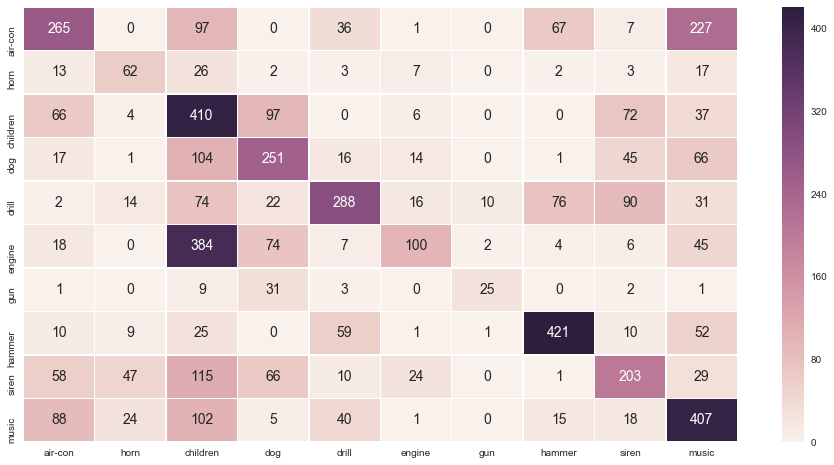

In [14]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

labels = ["air-con","horn","children","dog","drill","engine","gun","hammer","siren","music"]
print ("Showing Confusion Matrix")
y_prob = model.predict_proba(test_x, verbose=0)
y_pred = y_prob.argmax(axis=-1)
y_true = np.argmax(test_y, 1)
cm = confusion_matrix(y_true, y_pred)

df_cm = pd.DataFrame(cm, labels, labels)
plt.figure(figsize = (16,8))
sn.heatmap(df_cm, annot=True, annot_kws={"size": 14}, fmt='g', linewidths=.5, )

In [16]:
sound_file_paths = ["aircon.wav", "carhorn.wav", "play.wav", "dogbark.wav", "drill.wav",
                    "engine.wav","gunshots.wav","jackhammer.wav","siren.wav","music.wav"]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]
parent_dir = 'D://DataSets//ML_project//Samples//'


# create predictions for each of the sound classes
for s in range(len(sound_names)):

    print ("\n----- ", sound_names[s], "-----")
    # load audio file and extract features
    predict_file = parent_dir + sound_file_paths[s]
    predict_x = extract_feature_array(predict_file)
    
    # generate prediction, passing in just a single row of features
    predictions = model.predict(predict_x)
    
    if len(predictions) == 0: 
        print ("No prediction")
        continue
    
    #for i in range(len(predictions[0])):
    #    print sound_names[i], "=", round(predictions[0,i] * 100, 1)
    
    # get the indices of the top 2 predictions, invert into descending order
    ind = np.argpartition(predictions[0], -2)[-2:]
    ind[np.argsort(predictions[0][ind])]
    ind = ind[::-1]
    
    print ("Top guess: ", sound_names[ind[0]], " (",round(predictions[0,ind[0]],3),")")
    print ("2nd guess: ", sound_names[ind[1]], " (",round(predictions[0,ind[1]],3),")")


-----  air conditioner -----
Top guess:  air conditioner  ( 0.965 )
2nd guess:  siren  ( 0.013 )

-----  car horn -----
Top guess:  car horn  ( 0.989 )
2nd guess:  street music  ( 0.008 )

-----  children playing -----
Top guess:  street music  ( 0.461 )
2nd guess:  children playing  ( 0.348 )

-----  dog bark -----
Top guess:  children playing  ( 0.768 )
2nd guess:  dog bark  ( 0.126 )

-----  drilling -----
Top guess:  drilling  ( 0.974 )
2nd guess:  jackhammer  ( 0.023 )

-----  engine idling -----
Top guess:  engine idling  ( 0.986 )
2nd guess:  street music  ( 0.006 )

-----  gun shot -----
Top guess:  gun shot  ( 0.766 )
2nd guess:  dog bark  ( 0.121 )

-----  jackhammer -----
Top guess:  jackhammer  ( 0.822 )
2nd guess:  children playing  ( 0.066 )

-----  siren -----
Top guess:  siren  ( 0.999 )
2nd guess:  dog bark  ( 0.0 )

-----  street music -----
Top guess:  street music  ( 0.948 )
2nd guess:  drilling  ( 0.025 )
